In [1]:
import itertools
import sys, os

import numpy as np
import pandas as pd
from scipy.special import comb
from scipy import stats
import scipy.cluster.hierarchy as hac
import matplotlib.pyplot as plt
plt.style.use('classic')
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
sns.set(rc={'figure.figsize':(15,8)})
sns.set_context('poster')

In [2]:
%load_ext autoreload
%autoreload 2
import CCPA_lib as cp


In [24]:
sns.set_context('poster')

In [17]:
df = cp.load_experiment_csvs()
df = cp.update_calculated_fields(df)

In [18]:
df.head()

,day,experiment,sample,FL,PRO,ALT,culture,logFL,cumsumFL,cumsumlogFL,zscoreFL,diffFL,difflogFL,diffday,rateFL,ratelogFL,experiment_sample
0,0.000000,e1,1A,0.133,MED4,1A3,Co_Culture,-2.017406,0.133,-2.017406,-0.588733,NaN,NaN,NaN,NaN,NaN,"e1, 1A"
1,0.715972,e1,1A,0.159,MED4,1A3,Co_Culture,-1.838851,0.292,-3.856257,-0.575763,0.026,0.178555,0.715972,0.036314,0.249388,"e1, 1A"
2,1.925694,e1,1A,0.155,MED4,1A3,Co_Culture,-1.864330,0.447,-5.720587,-0.577758,-0.004,-0.025479,1.209722,-0.003307,-0.021062,"e1, 1A"
3,2.831250,e1,1A,0.180,MED4,1A3,Co_Culture,-1.714798,0.627,-7.435386,-0.565287,0.025,0.149532,0.905556,0.027607,0.165127,"e1, 1A"
4,6.674306,e1,1A,0.632,MED4,1A3,Co_Culture,-0.458866,1.259,-7.894252,-0.339798,0.452,1.255933,3.843056,0.117615,0.326806,"e1, 1A"


In [41]:
dfcat = cp.concat_experiments(df)

C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [20]:
df.to_pickle('CCPA.pkl.gz')

In [5]:
df = pd.read_pickle('CCPA.pkl.gz')

In [14]:
dfc = df.loc[(df.experiment.isin(['e3', 'e4','e5', 'e6'])) & (df.culture == 'Co_Culture')]

Text(0.5, 0.98, 'Progress per PRO (FL)')

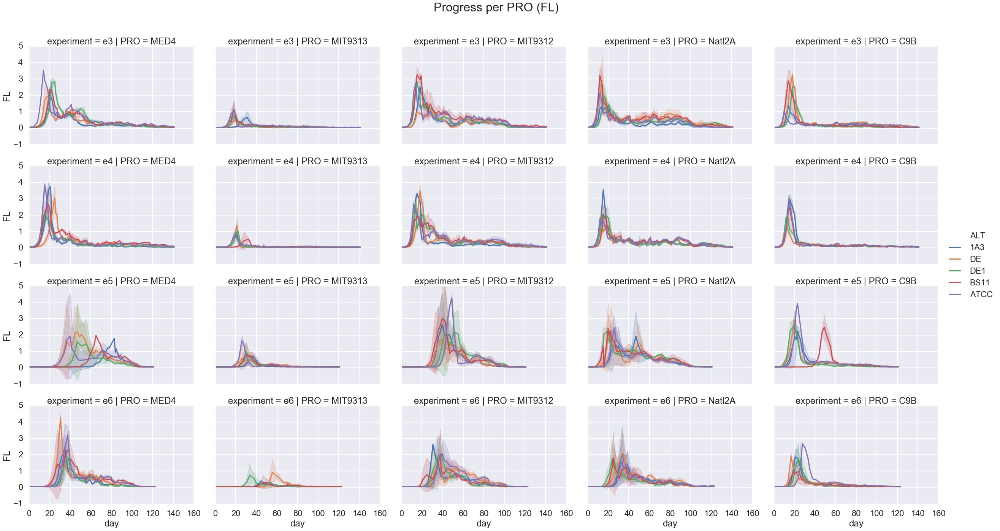

In [25]:
sns.relplot(data=dfc, x='day', y='FL', kind='line', ci='sd',
            col='PRO', hue='ALT', row='experiment', 
            aspect=1.4
           )
#plt.title("Progress per PRO")
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per PRO (FL)", fontsize=32)


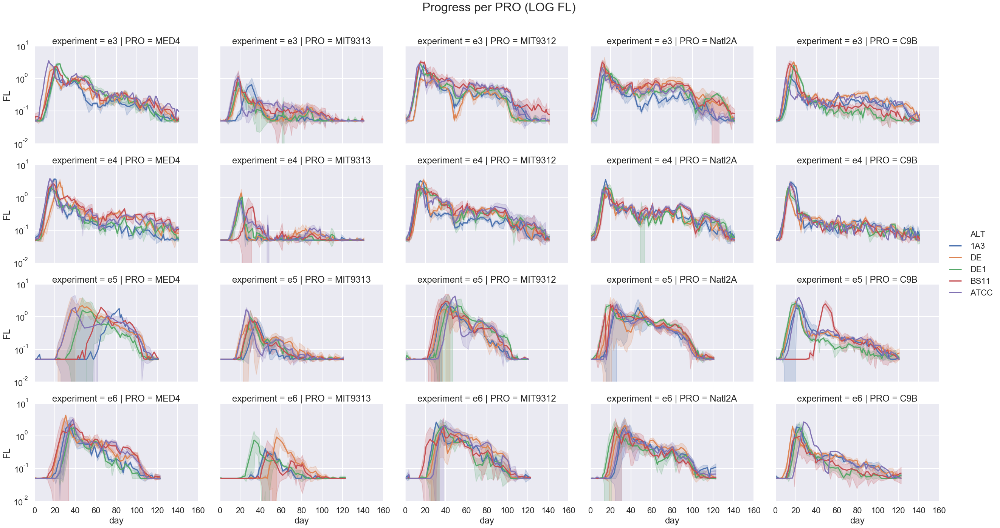

In [26]:
g= sns.relplot(data=dfc, x='day', y='FL', kind='line', ci='sd',
            col='PRO', hue='ALT', row='experiment', 
            aspect=1.4
           )
g.fig.get_axes()[0].set_yscale('log')

plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per PRO (LOG FL)", fontsize=32)
plt.show()


Text(0.5, 0.98, 'Progress per PRO (cummulative sum of log FL)')

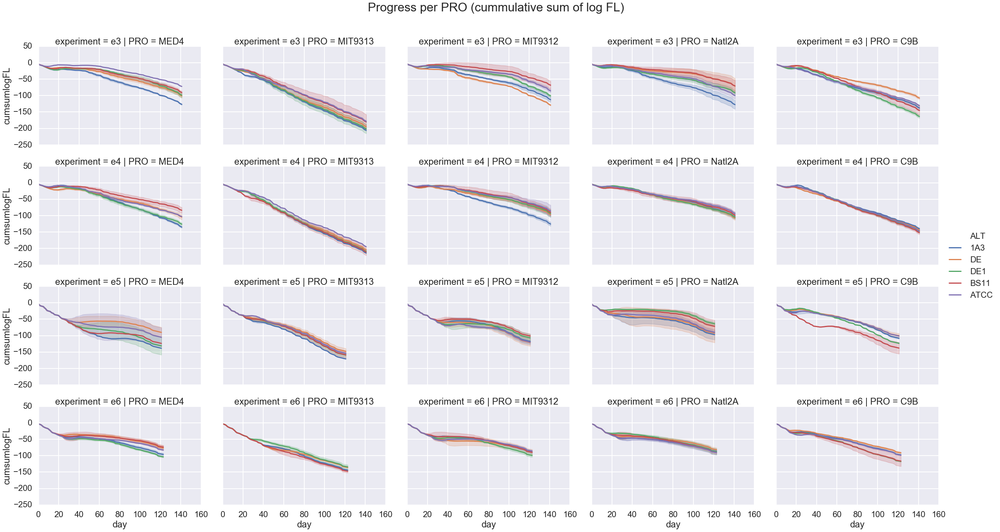

In [27]:
sns.relplot(data=dfc, x='day', y='cumsumlogFL', kind='line', ci='sd',
            col='PRO', hue='ALT', row='experiment', 
            aspect=1.4
           )
#plt.title("Progress per PRO")
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per PRO (cummulative sum of log FL)", fontsize=32)


Text(0.5, 0.98, 'Progress per PRO (change rate of FL)')

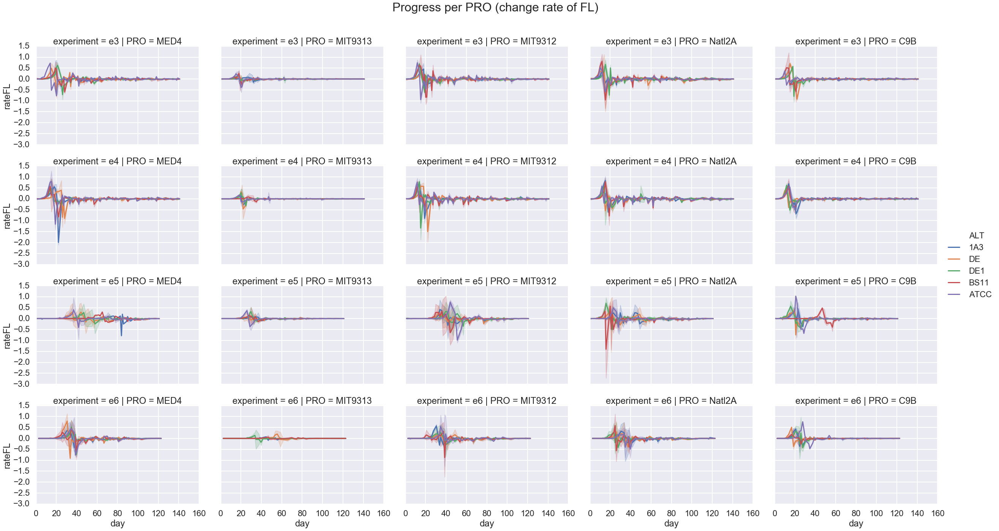

In [41]:
g=sns.relplot(data=dfc, x='day', y='rateFL', kind='line', ci='sd',
            col='PRO', hue='ALT', row='experiment', 
            aspect=1.4
           )

#plt.title("Progress per PRO")
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per PRO (change rate of FL)", fontsize=32)


Text(0.5, 0.98, 'Progress per ALT (log FL)')

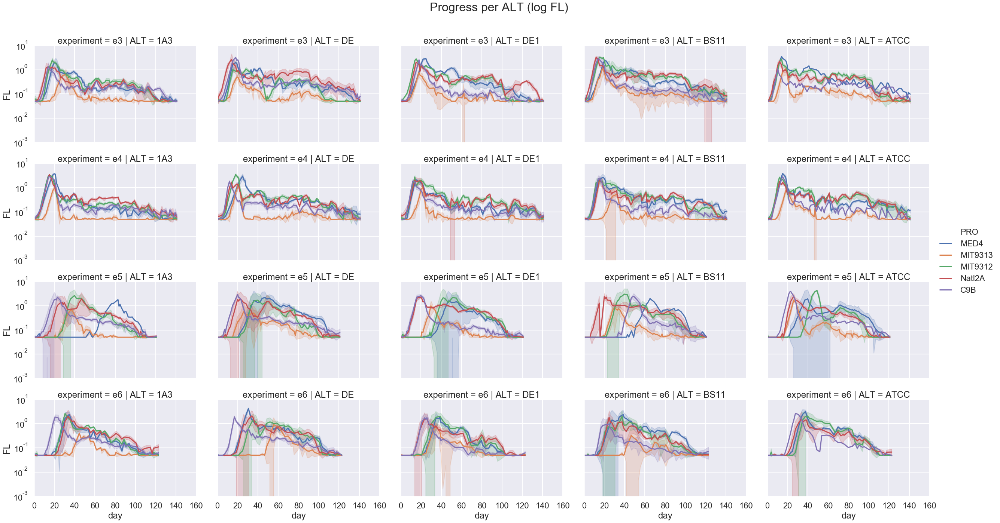

In [43]:
g= sns.relplot(data=dfc, x='day', y='FL', kind='line', ci='sd',
            hue='PRO', col='ALT', row='experiment',
           aspect=1.4)
g.fig.get_axes()[0].set_yscale('log')

plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per ALT (log FL)", fontsize=32)


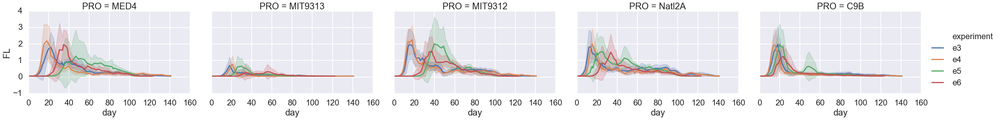

In [47]:
g =sns.relplot(data=dfc, x='day', y='FL', kind='line', ci='sd',
            col='PRO', aspect=1.4, #style='ALT',  #col='culture', #col='ALT', 
            
            hue='experiment') #, col_wrap=3)
#g.fig.get_axes()[0].set_yscale('log')

#plt.subplots_adjust(top=0.9)
#plt.suptitle("Progress per Experiment", fontsize=32)


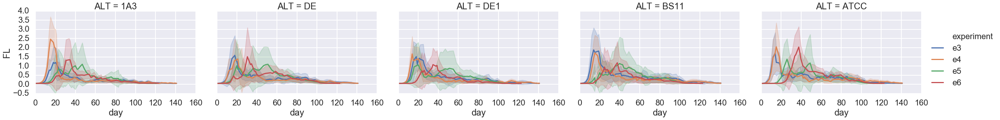

In [48]:
g= sns.relplot(data=dfc, x='day', y='FL', kind='line', ci='sd',
            col='ALT', aspect=1.4, #style='ALT',  #col='culture', #col='ALT', 
            
            hue='experiment') #, col_wrap=3)
#g.fig.get_axes()[0].set_yscale('log')

#plt.subplots_adjust(top=0.9)
#plt.suptitle("Progress per Experiment", fontsize=32)


# Features from Curves

In [49]:
g = cp.generate_features(dfc)

In [50]:
g.columns

Index(['max', 'max_log', 'max_day', 'min', 'min_log', 'experiment', 'sample',
       'PRO', 'ALT', 'culture', 'growth_half_day', 'growth_half_val',
       'growth_log_half_day', 'growth_log_half_val', 'growth_tenth_day',
       'growth_tenth_val', 'growth_log_tenth_day', 'growth_log_tenth_val',
       'growth_log_intercept', 'growth_log_coefficient', 'growth_log_score_r2',
       'growth_auc', 'growth_logauc', 'growth_diff', 'growth_diff_log',
       'growth_mean', 'growth_std', 'growth_min', 'growth_max',
       'growth_mean_log', 'growth_std_log', 'growth_min_log', 'growth_max_log',
       'growth_mean_rate', 'growth_std_rate', 'growth_min_rate',
       'growth_max_rate', 'growth_mean_log_rate', 'growth_std_log_rate',
       'growth_min_log_rate', 'growth_max_log_rate', 'decay_half_day',
       'decay_half_val', 'decay_log_half_day', 'decay_log_half_val',
       'decay_tenth_day', 'decay_tenth_val', 'decay_log_tenth_day',
       'decay_log_tenth_val', 'decay_log_intercept', 'decay_lo

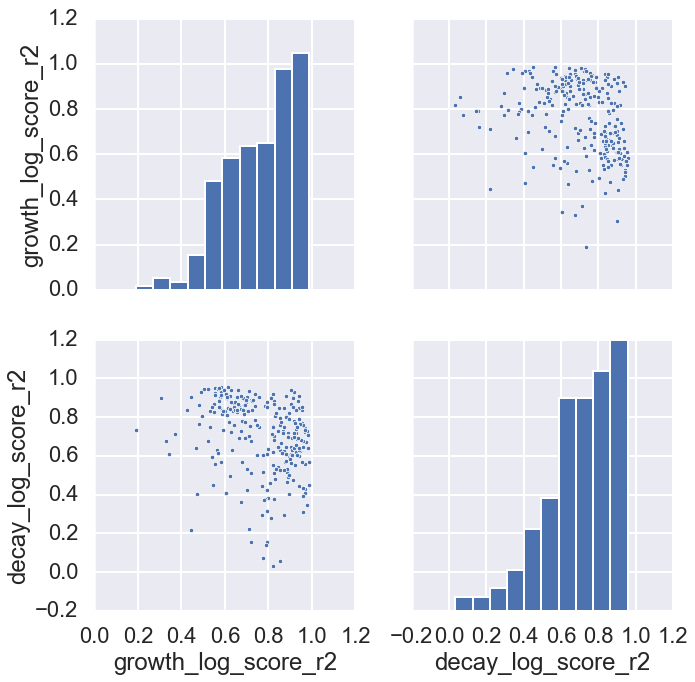

In [51]:
#sns.pairplot(data=g.loc[[]], x='growth_log_score_r2' ,y='decay_log_score_r2')
sns.pairplot(data=g.loc[g.max_day > -1,['growth_log_score_r2' ,'decay_log_score_r2']], height=5)

In [52]:
X = cp.features2X(g)
metadf = cp.get_meta(g, meta_col=['experiment_sample', 'experiment','sample', 'PRO', 'ALT', 'culture'], 
                     value_col='max')
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col='experiment_sample')

C:\Users\Osnat\Anaconda3\lib\site-packages\pandas\core\frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


Variance percent explained
 [0.3873703  0.20153907]


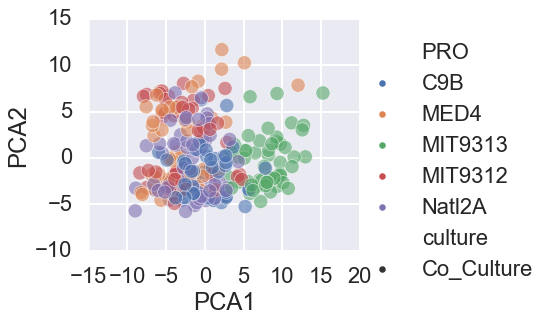

In [62]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=200, alpha=0.6, height=5, aspect=1.2)

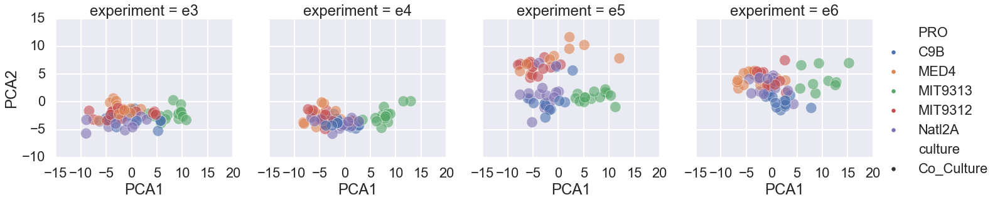

In [56]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, alpha=0.6,
            col='experiment', height=5)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

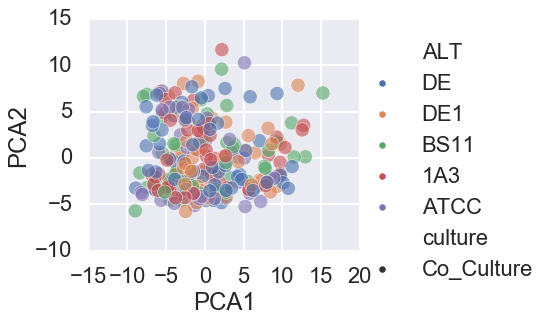

In [63]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', style='culture',s=200, alpha=0.6, height=5, aspect=1.2)

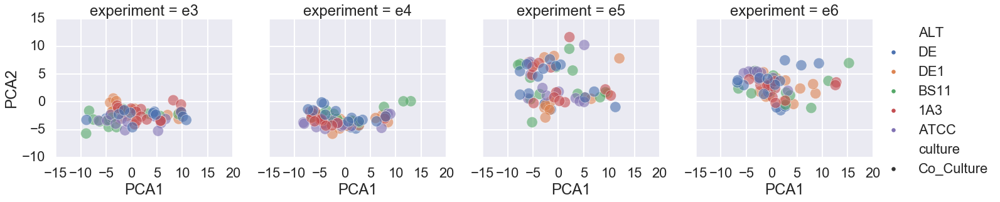

In [64]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', style='culture',s=300, alpha=0.6,
            col='experiment', height=5)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [65]:
X = cp.features2X(g)
y = g['PRO']
metadf = cp.get_meta(g, meta_col=['experiment_sample', 'experiment','sample', 'PRO', 'ALT', 'culture'], 
                     value_col='max')
clf = cp.forest_classifier(X=X, y=y)

0.6555555555555556


C:\Users\Osnat\Anaconda3\lib\site-packages\pandas\core\frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


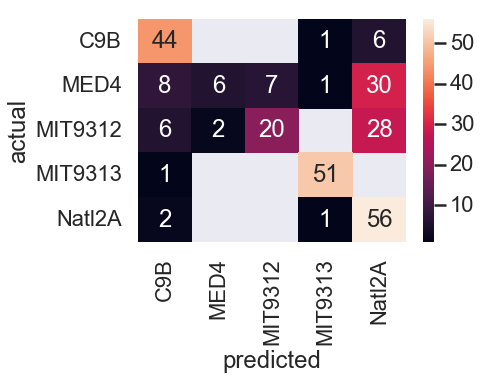

In [66]:
cp.forest_heatmap(clf=clf, X=X, y=y)

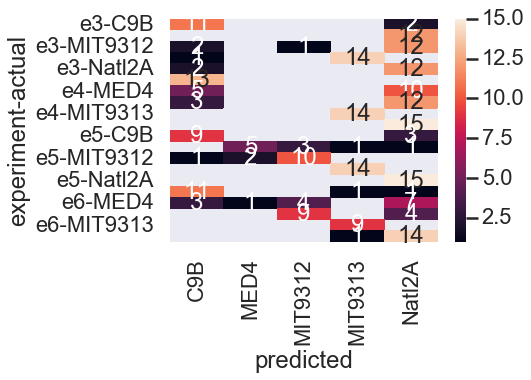

In [69]:
m= metadf.set_index(keys='experiment_sample')
cp.forest_heatmap(clf=clf, X=X, y=y, metadf=m, breakdown='experiment')

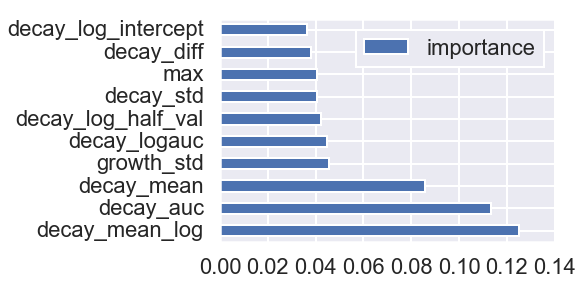

In [68]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

In [235]:
g2 = g.loc[(g.experiment == 'e1') | 
               (g.experiment == 'e3') |
               (g.experiment == 'e4') |
               (g.experiment == 'e5') |
               (g.experiment == 'e6') 
              ]

In [236]:
X = cp.features2X(g2)
y = g2['PRO']
clf = cp.forest_classifier(X=X, y=y)

0.5958005249343832


C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\frame.py:3790: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


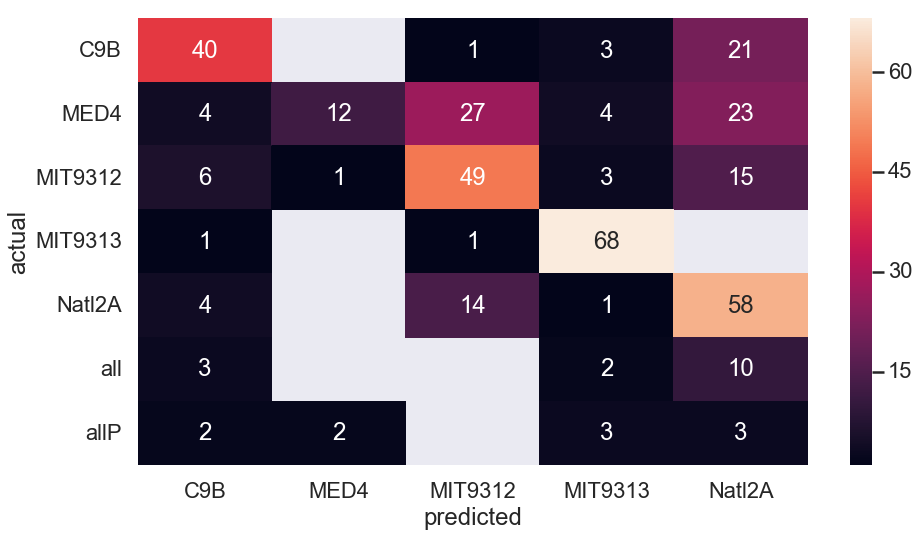

In [237]:
cp.forest_heatmap(clf=clf, X=X, y=y)

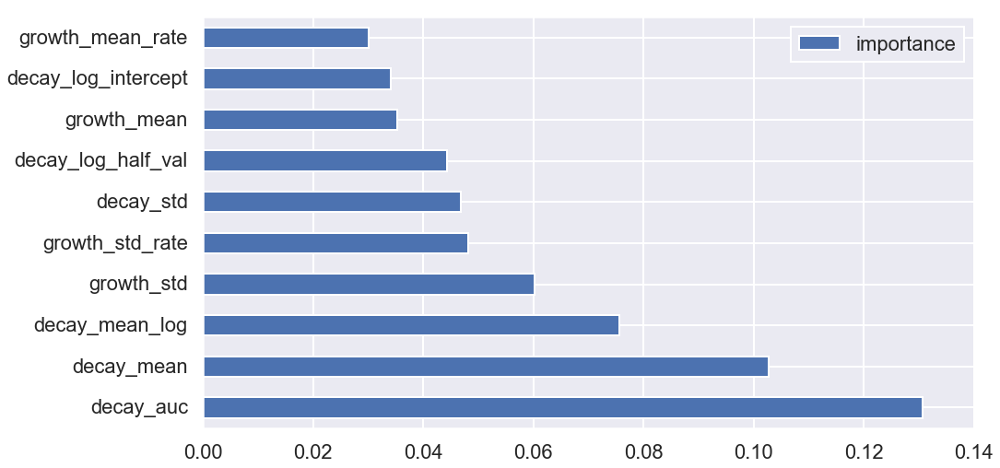

In [238]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

In [242]:
X = cp.features2X(g2)
y = g2['ALT']
clf = cp.forest_classifier(X=X, y=y)

0.3910761154855643


C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\frame.py:3790: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


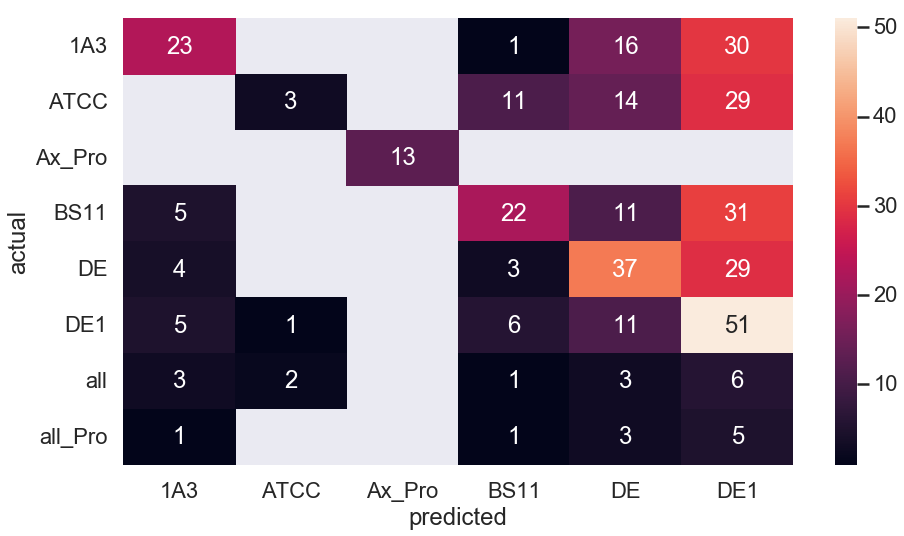

In [244]:
cp.forest_heatmap(clf=clf, X=X, y=y)

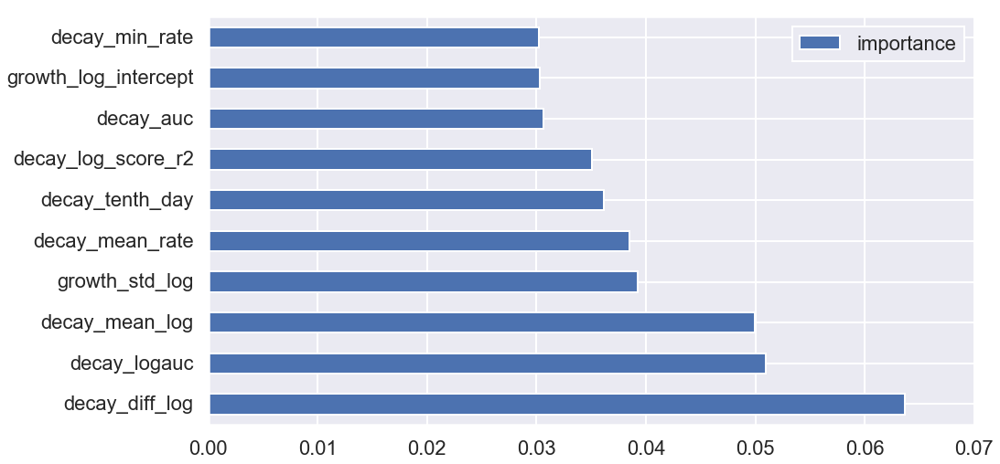

In [245]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

# Comparison of all Experiments

In [195]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
X = df.pivot(index='experiment_sample', columns='day', values='logFL')
# X.fillna(method='pad', inplace=True)
# scaledX = StandardScaler().fit_transform(X)
# pca = PCA(n_components=2)
# principalComponents = pca.fit_transform(scaledX)
# print('Variance percent explained\n', pca.explained_variance_ratio_)
# principalDf = pd.DataFrame(data = principalComponents
#              , columns = ['PCA1', 'PCA2'])
# principalDf.set_index(X.index, inplace=True)
# meta = meta_dfs[0]
# dfpca = pd.merge(left=principalDf, left_index=True, right=meta, right_on='sample')


In [248]:
X = cp.experiments2X(df, sample_col='experiment_sample')
metadf = cp.get_meta(df)
dfpca = cp.run_pca(X=X, metadf=metadf)


Variance percent explained
 [0.86851513 0.08358386]


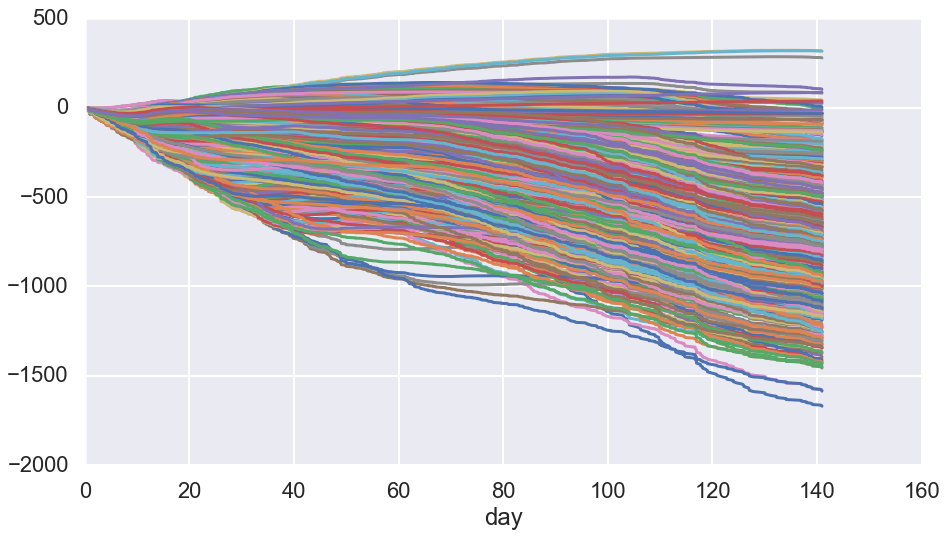

In [251]:
X.T.plot(legend=False)

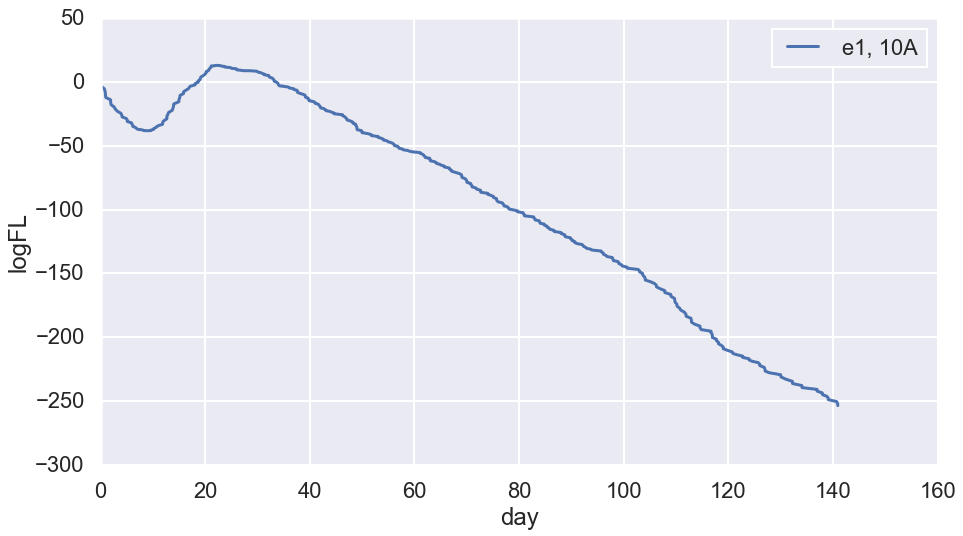

In [255]:
n = 'e1, 10A'
plt.plot(X.T[n])
d= df.loc[(df.experiment_sample == 'n')]
#d['cumsumlogFL'] = d.logFL.transform(pd.Series.cumsum)
sns.lineplot(data=d,x='day', y='logFL')


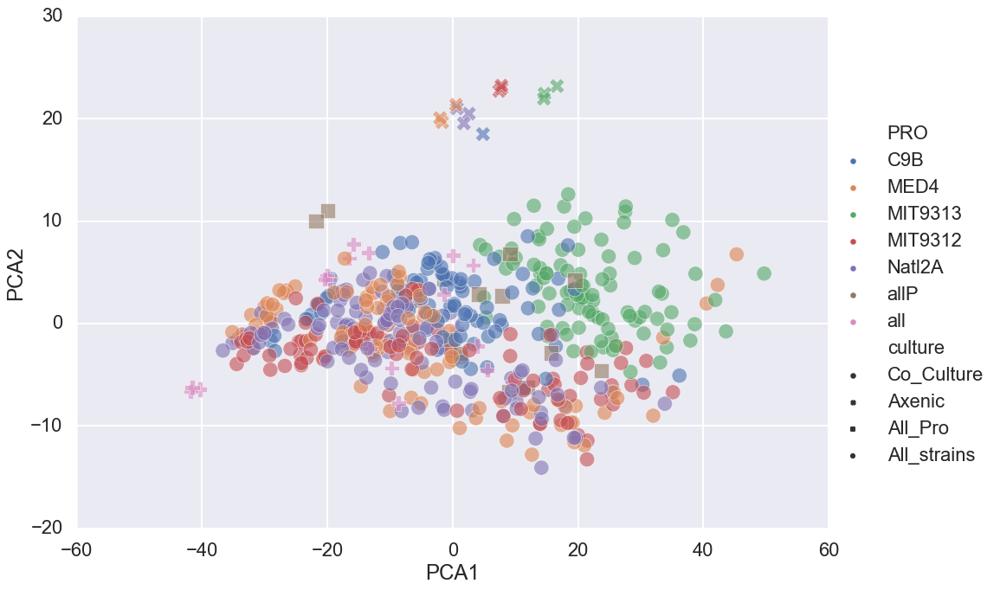

In [258]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300,alpha=0.6,
             height=10, aspect=1.4)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

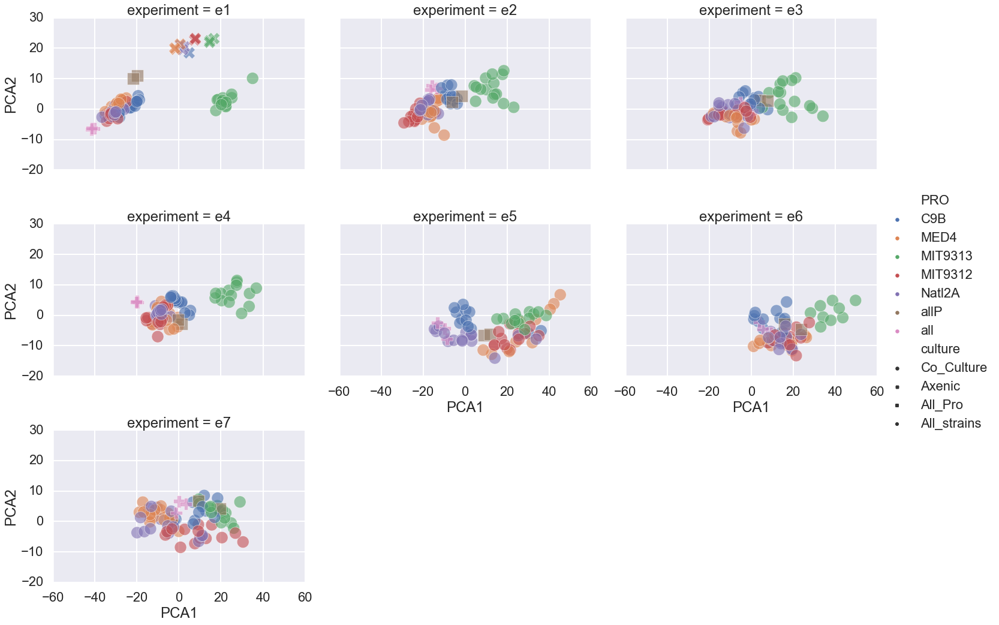

In [260]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=400, alpha=0.6,
            col='experiment', aspect=1.4, col_wrap=3)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

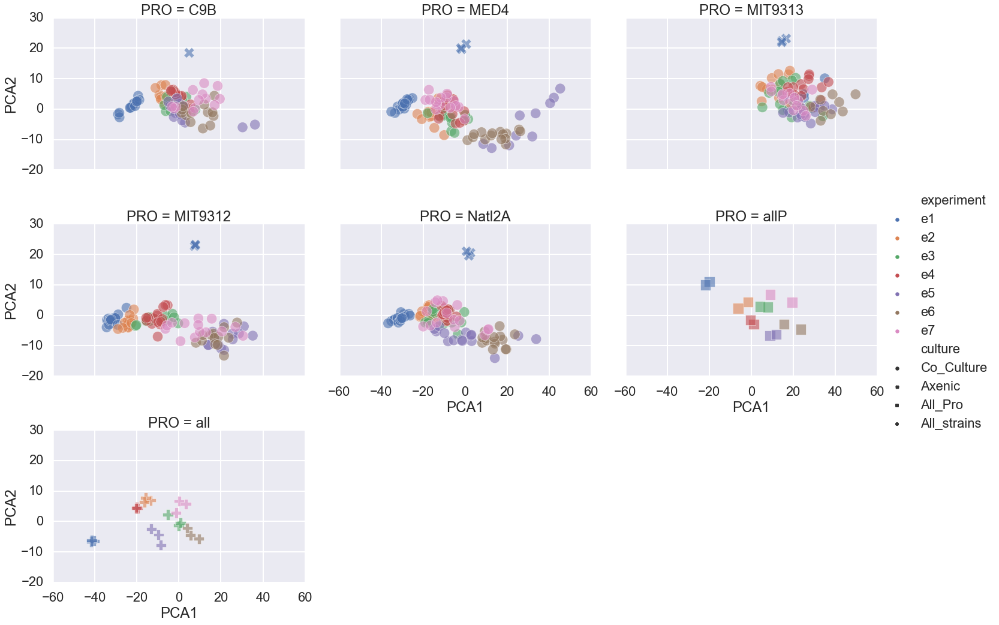

In [261]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='experiment', style='culture',s=300, alpha=0.6,
            col='PRO', aspect=1.4, col_wrap=3)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

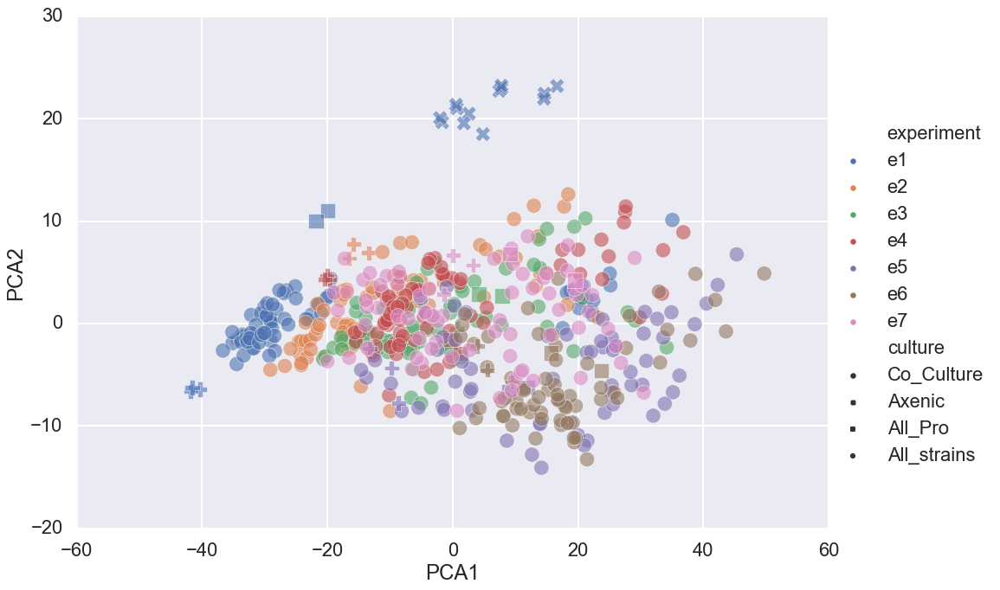

In [263]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='experiment', style='culture',s=300,  
            aspect=1.4, height=10, alpha=0.6,
           # col='PRO', aspect=1.4, col_wrap=3
           )
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

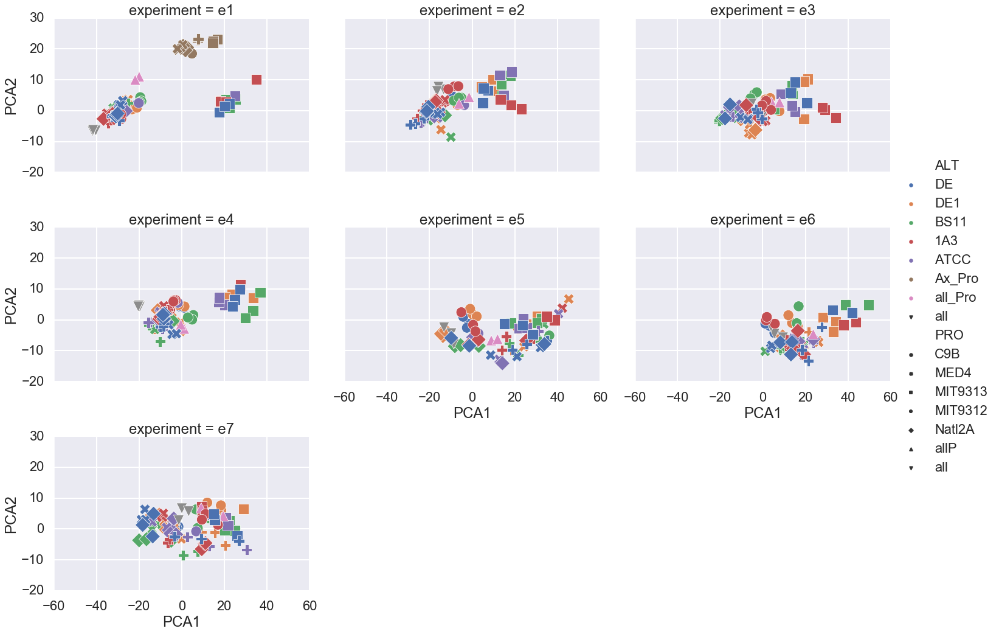

In [265]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', style='PRO',s=300, height=5,
            col='experiment', aspect=1.4, col_wrap=3)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [276]:
X = cp.experiments2X(df)
metadf = cp.get_meta(df)
y = metadf['PRO']
clf = cp.forest_classifier(X=X, y=y)

0.4392523364485981


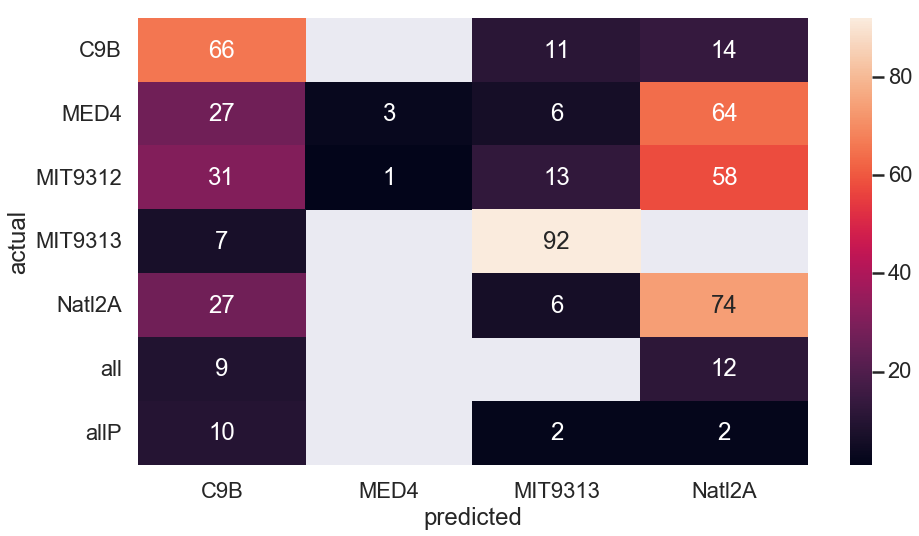

In [277]:
cp.forest_heatmap(clf=clf, X=X, y=y)

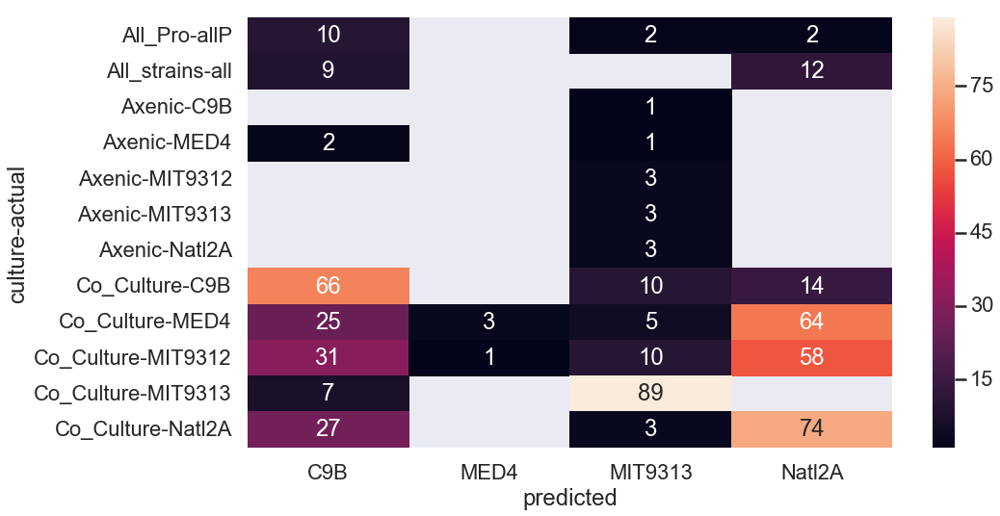

In [301]:
cp.forest_heatmap(clf, X, y, metadf=metadf, breakdown='culture')

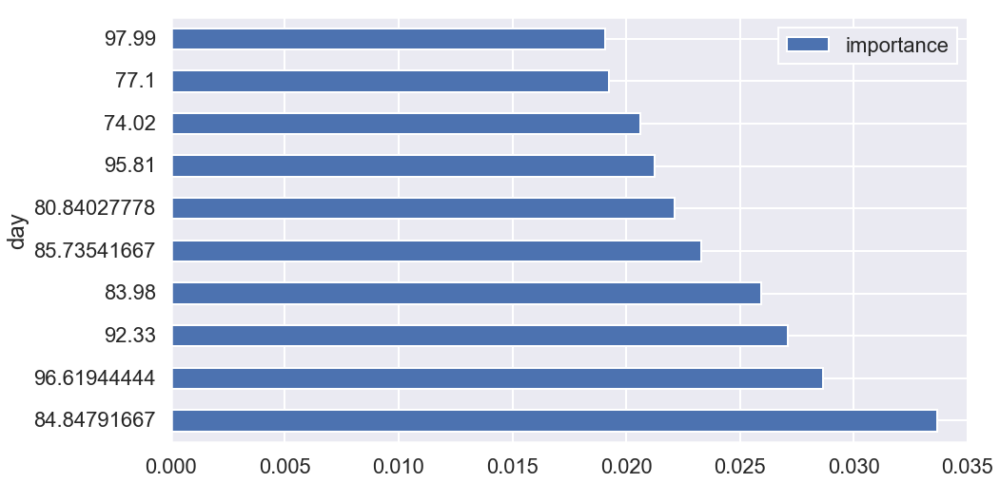

In [278]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

# Decay Curve

In [328]:
df.head()

,day,experiment,sample,FL,PRO,ALT,culture,logFL,cumsumFL,cumsumlogFL,zscoreFL,diffFL,difflogFL,diffday,rateFL,ratelogFL,experiment_sample
0,0.000000,e1,1A,0.133,MED4,1A3,Co_Culture,-2.017406,0.133,-2.017406,-0.588733,NaN,NaN,NaN,NaN,NaN,"e1, 1A"
1,0.715972,e1,1A,0.159,MED4,1A3,Co_Culture,-1.838851,0.292,-3.856257,-0.575763,0.026,0.178555,0.715972,0.036314,0.249388,"e1, 1A"
2,1.925694,e1,1A,0.155,MED4,1A3,Co_Culture,-1.864330,0.447,-5.720587,-0.577758,-0.004,-0.025479,1.209722,-0.003307,-0.021062,"e1, 1A"
3,2.831250,e1,1A,0.180,MED4,1A3,Co_Culture,-1.714798,0.627,-7.435386,-0.565287,0.025,0.149532,0.905556,0.027607,0.165127,"e1, 1A"
4,6.674306,e1,1A,0.632,MED4,1A3,Co_Culture,-0.458866,1.259,-7.894252,-0.339798,0.452,1.255933,3.843056,0.117615,0.326806,"e1, 1A"


In [334]:
y_col = 'FL'
x_col = 'day'
d = df.groupby('experiment_sample').get_group('e1, 11B').reset_index()
d


,index,day,experiment,sample,FL,PRO,ALT,culture,logFL,cumsumFL,cumsumlogFL,zscoreFL,diffFL,difflogFL,diffday,rateFL,ratelogFL,experiment_sample
0,2728,0.000000,e1,11B,0.183,MED4,DE1,Co_Culture,-1.698269,0.183,-1.698269,-0.488617,NaN,NaN,NaN,NaN,NaN,"e1, 11B"
1,2729,0.715972,e1,11B,0.128,MED4,DE1,Co_Culture,-2.055725,0.311,-3.753994,-0.530519,-0.055,-0.357456,0.715972,-0.076819,-0.499259,"e1, 11B"
2,2730,1.925694,e1,11B,0.182,MED4,DE1,Co_Culture,-1.703749,0.493,-5.457743,-0.489378,0.054,0.351976,1.209722,0.044638,0.290956,"e1, 11B"
3,2731,2.831250,e1,11B,0.244,MED4,DE1,Co_Culture,-1.410587,0.737,-6.868330,-0.442144,0.062,0.293162,0.905556,0.068466,0.323737,"e1, 11B"
4,2732,6.674306,e1,11B,0.774,MED4,DE1,Co_Culture,-0.256183,1.511,-7.124513,-0.038361,0.530,1.154404,3.843056,0.137911,0.300387,"e1, 11B"
5,2733,9.642361,e1,11B,1.625,MED4,DE1,Co_Culture,0.485508,3.136,-6.639005,0.609976,0.851,0.741691,2.968056,0.286720,0.249891,"e1, 11B"
6,2734,10.603472,e1,11B,2.516,MED4,DE1,Co_Culture,0.922670,5.652,-5.716335,1.288788,0.891,0.437163,0.961111,0.927052,0.454851,"e1, 11B"
7,2735,12.650694,e1,11B,4.076,MED4,DE1,Co_Culture,1.405116,9.728,-4.311219,2.477280,1.560,0.482446,2.047222,0.762008,0.235659,"e1, 11B"
8,2736,13.694444,e1,11B,6.113,MED4,DE1,Co_Culture,1.810418,15.841,-2.500801,4.029176,2.037,0.405302,1.043750,1.951617,0.388313,"e1, 11B"
9,2737,14.960417,e1,11B,7.116,MED4,DE1,Co_Culture,1.962346,22.957,-0.538456,4.793315,1.003,0.151928,1.265972,0.792276,0.120009,"e1, 11B"


In [335]:
y_col = 'FL'
x_col = 'day'
maxidx = d[y_col].idxmax()
maxday = d.loc[maxidx][x_col]
print(maxidx, maxday)


9 14.96041667


In [337]:
c = d[maxidx:].reset_index()
c


,level_0,index,day,experiment,sample,FL,PRO,ALT,culture,logFL,cumsumFL,cumsumlogFL,zscoreFL,diffFL,difflogFL,diffday,rateFL,ratelogFL,experiment_sample
0,9,2737,14.960417,e1,11B,7.116,MED4,DE1,Co_Culture,1.962346,22.957,-0.538456,4.793315,1.003,0.151928,1.265972,0.792276,0.120009,"e1, 11B"
1,10,2738,15.853472,e1,11B,5.600,MED4,DE1,Co_Culture,1.722767,28.557,1.184311,3.638345,-1.516,-0.239579,0.893056,-1.697543,-0.268269,"e1, 11B"
2,11,2739,16.952083,e1,11B,4.928,MED4,DE1,Co_Culture,1.594933,33.485,2.779244,3.126379,-0.672,-0.127833,1.098611,-0.611681,-0.116359,"e1, 11B"
3,12,2740,19.657639,e1,11B,2.476,MED4,DE1,Co_Culture,0.906644,35.961,3.685889,1.258314,-2.452,-0.688289,2.705556,-0.906283,-0.254398,"e1, 11B"
4,13,2741,20.660417,e1,11B,2.555,MED4,DE1,Co_Culture,0.938052,38.516,4.623941,1.318500,0.079,0.031408,1.002778,0.078781,0.031321,"e1, 11B"
5,14,2742,21.843056,e1,11B,1.421,MED4,DE1,Co_Culture,0.351361,39.937,4.975302,0.454558,-1.134,-0.586691,1.182639,-0.958873,-0.496087,"e1, 11B"
6,15,2743,22.951389,e1,11B,1.624,MED4,DE1,Co_Culture,0.484892,41.561,5.460194,0.609215,0.203,0.133531,1.108333,0.183158,0.120479,"e1, 11B"
7,16,2744,23.623611,e1,11B,1.696,MED4,DE1,Co_Culture,0.528273,43.257,5.988467,0.664068,0.072,0.043380,0.672222,0.107107,0.064533,"e1, 11B"
8,17,2745,26.702083,e1,11B,1.587,MED4,DE1,Co_Culture,0.461845,44.844,6.450312,0.581026,-0.109,-0.066427,3.078472,-0.035407,-0.021578,"e1, 11B"
9,18,2746,27.672222,e1,11B,1.604,MED4,DE1,Co_Culture,0.472501,46.448,6.922812,0.593978,0.017,0.010655,0.970139,0.017523,0.010983,"e1, 11B"


In [339]:
r = pd.DataFrame()
r[x_col] = c[x_col] - c[x_col].min()
r[y_col] = c[y_col] / c[y_col].max()
r

,day,FL
0,0.000000,1.000000
1,0.893056,0.786959
2,1.991667,0.692524
3,4.697222,0.347948
4,5.700000,0.359050
5,6.882639,0.199691
6,7.990972,0.228218
7,8.663194,0.238336
8,11.741667,0.223019
9,12.711806,0.225408


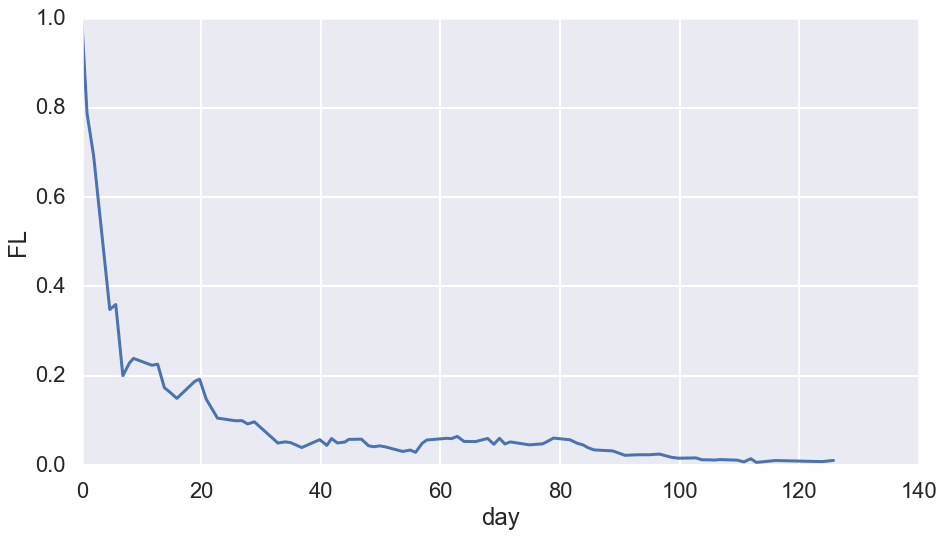

In [341]:
sns.lineplot(data=r, x=x_col, y=y_col)

In [352]:
def extract_decay(d, y_col = 'FL', x_col = 'day'):
    d = d.reset_index()
    maxidx = d[y_col].idxmax()
    c = d[maxidx:].reset_index()
    r = pd.DataFrame()
    r[x_col] = c[x_col] - c[x_col].min()
    r[y_col] = c[y_col] / c[y_col].max()
    meta_cols = ['experiment', 'sample', 'PRO', 'ALT', 'culture']
    for c in meta_cols:
        r[c] = d[c].unique()[0]

    return r

In [353]:
dfd = df.groupby('experiment_sample').apply(extract_decay)
dfd.reset_index(level=0, inplace=True)
dfd

,experiment_sample,day,FL,experiment,sample,PRO,ALT,culture
0,"e1, 10A",0.000000,1.000000,e1,10A,C9B,DE,Co_Culture
1,"e1, 10A",0.893056,0.719623,e1,10A,C9B,DE,Co_Culture
2,"e1, 10A",1.991667,0.489059,e1,10A,C9B,DE,Co_Culture
3,"e1, 10A",4.697222,0.520192,e1,10A,C9B,DE,Co_Culture
4,"e1, 10A",5.700000,0.448141,e1,10A,C9B,DE,Co_Culture
5,"e1, 10A",6.882639,0.207970,e1,10A,C9B,DE,Co_Culture
6,"e1, 10A",7.990972,0.146593,e1,10A,C9B,DE,Co_Culture
7,"e1, 10A",8.663194,0.142146,e1,10A,C9B,DE,Co_Culture
8,"e1, 10A",11.741667,0.141968,e1,10A,C9B,DE,Co_Culture
9,"e1, 10A",12.711806,0.175769,e1,10A,C9B,DE,Co_Culture


In [354]:
dfd = cp.update_calculated_fields(dfd, group_col='experiment_sample')


C:\Users\wosnat\Anaconda3\lib\site-packages\scipy\stats\stats.py:2247: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


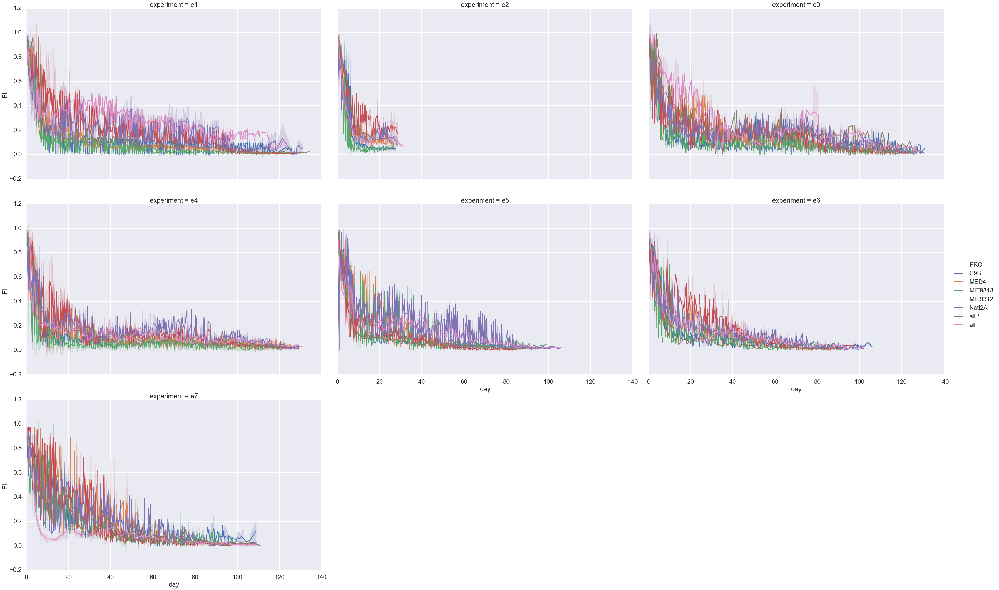

In [363]:
sns.relplot(data=dfd, x='day', y='FL', hue='PRO', kind='line', ci='sd', height=10, aspect=1.6, col='experiment', col_wrap=3)

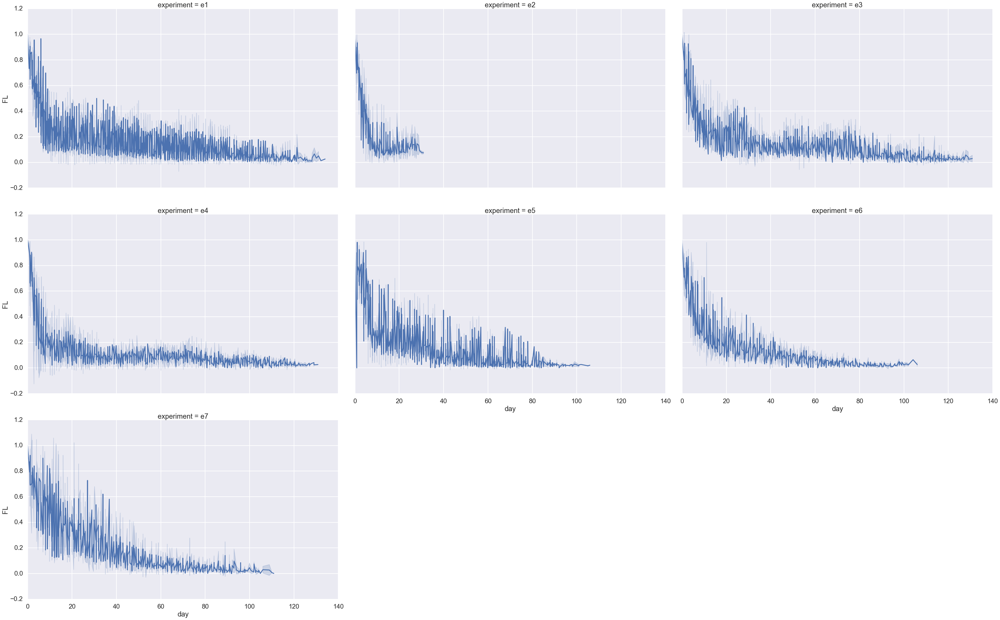

In [365]:
sns.relplot(data=dfd, x='day', y='FL',  kind='line', ci='sd', height=10, aspect=1.6, col='experiment', col_wrap=3)

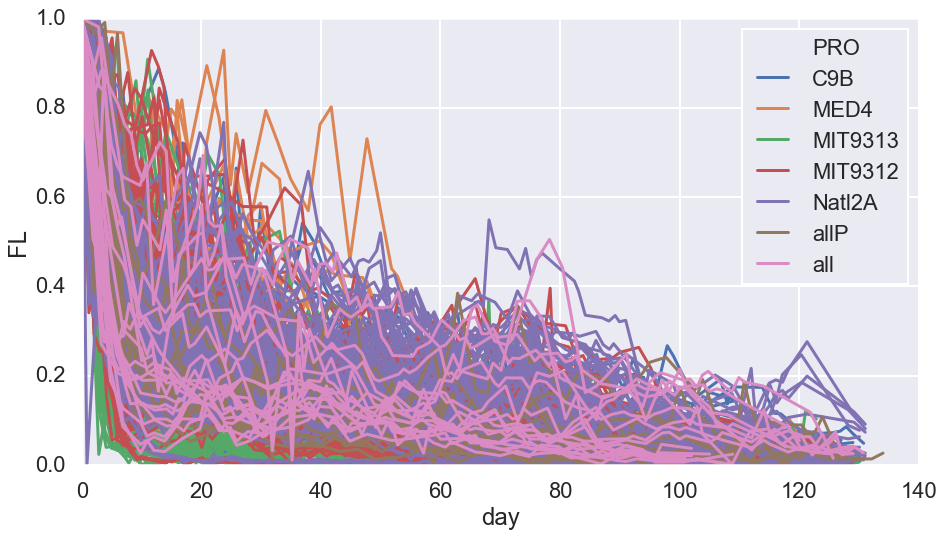

In [374]:
sns.lineplot(data=dfd, x='day', y='FL',    units='experiment_sample', estimator=None, hue='PRO', dashes='experiment')

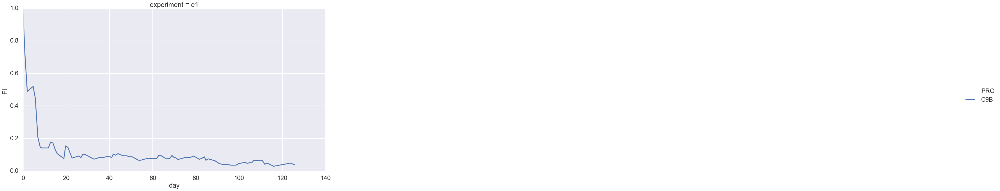

In [364]:
sns.relplot(data=dfd.loc[dfd.experiment_sample == 'e1, 10A'], x='day', y='FL', hue='PRO', kind='line', ci='sd', height=10, aspect=1.6, col='experiment', col_wrap=3)

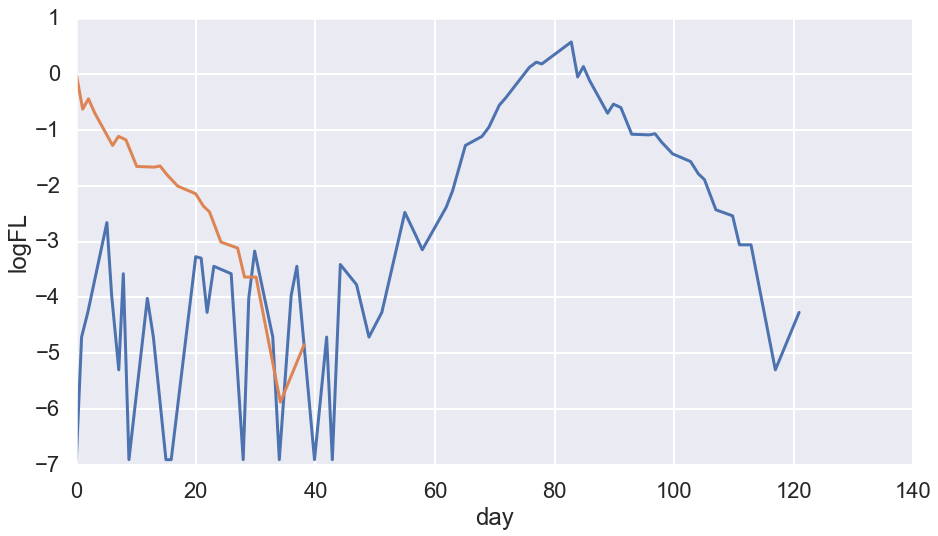

In [390]:
esample = 'e1, 11B'
esample = 'e7, 9C'
esample = 'e1, 36B'
esample = 'e5, 1C'
sns.lineplot(data=df.loc[df.experiment_sample == esample], x=x_col, y='logFL')
sns.lineplot(data=dfd.loc[dfd.experiment_sample == esample], x=x_col, y='logFL')


In [384]:
max_day = dfd.loc[dfd.experiment != 'e2'].groupby('experiment_sample')['day'].max()

experiment_sample
e5, 1C     38.11
e5, 11C    43.04
e5, 21B    49.12
e6, 17A    53.06
e5, 16B    55.82
e6, 7C     64.06
e5, 13B    65.95
e5, 11B    65.95
e6, 7A     67.18
e5, 6B     69.80
e6, 8B     71.02
e5, 23A    71.95
e5, 23C    71.95
e5, 9A     71.95
e5, 8A     71.95
e5, 20C    71.95
e5, 20B    74.03
e5, 4C     74.03
e5, 11A    74.03
e5, 3B     74.03
e5, 6C     74.03
e7, 11A    76.08
e6, 17C    76.09
e5, 18C    78.08
e6, 2A     78.15
e6, 2C     78.15
e5, 13C    79.03
e5, 8C     79.03
e5, 21C    81.06
e5, 18B    81.06
Name: day, dtype: float64

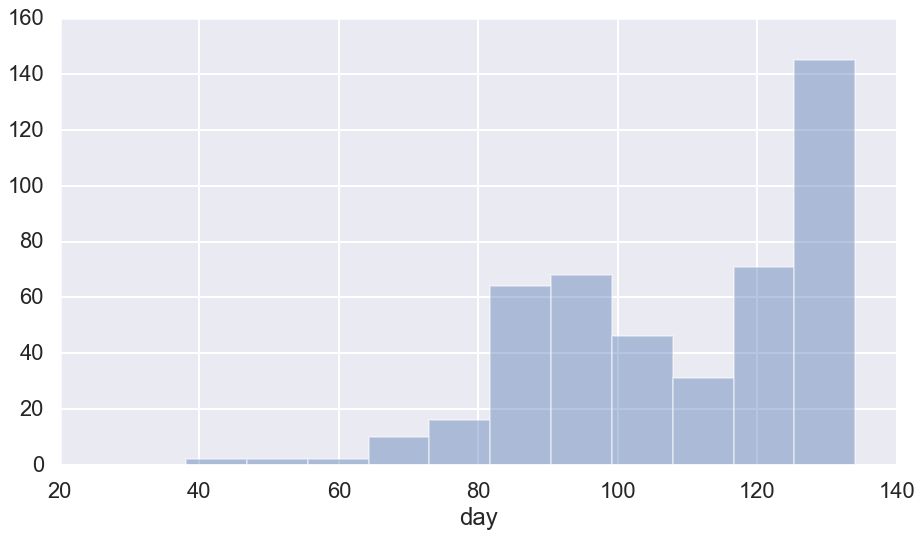

In [391]:
sns.distplot(max_day,kde=False)
max_day.sort_values().head(30)


In [392]:
max_day.shape

(457,)

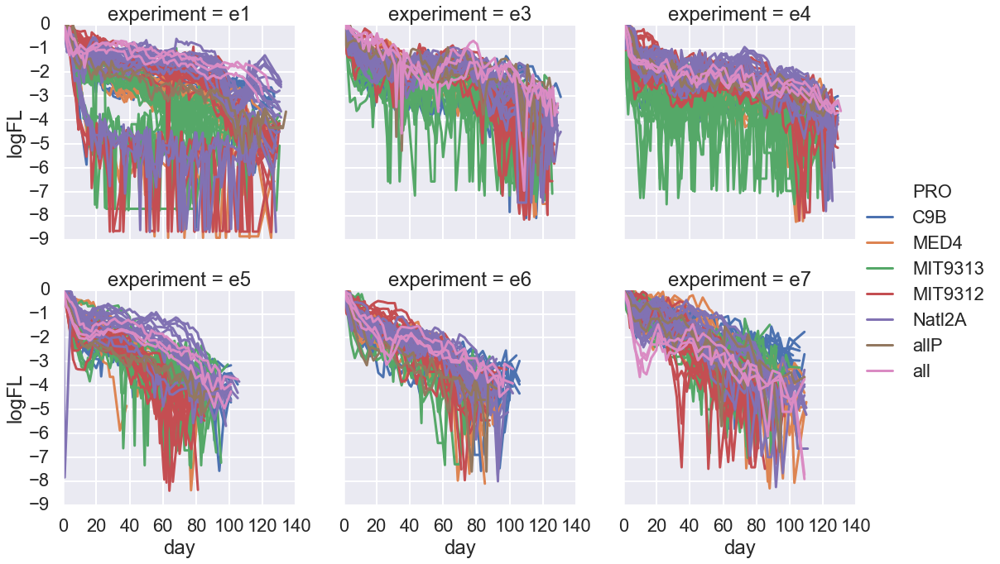

In [401]:
sns.relplot(data=dfd.loc[dfd.experiment != 'e2'], x='day', y='logFL', col='experiment', kind='line', hue='PRO',
             units='experiment_sample', estimator=None, col_wrap=3)

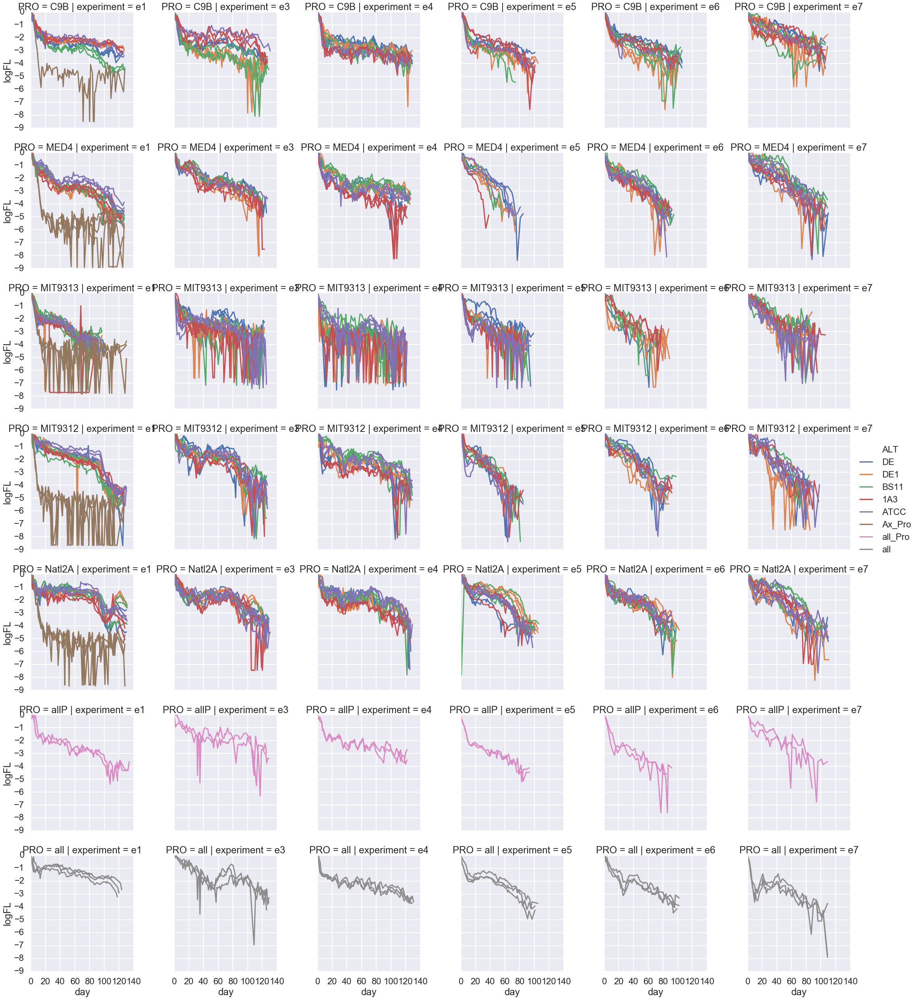

In [410]:
sns.relplot(data=dfd.loc[dfd.experiment != 'e2'], x='day', y='logFL', col='experiment', kind='line', row='PRO',
             units='experiment_sample', estimator=None, hue='ALT'#col_wrap=3
           )

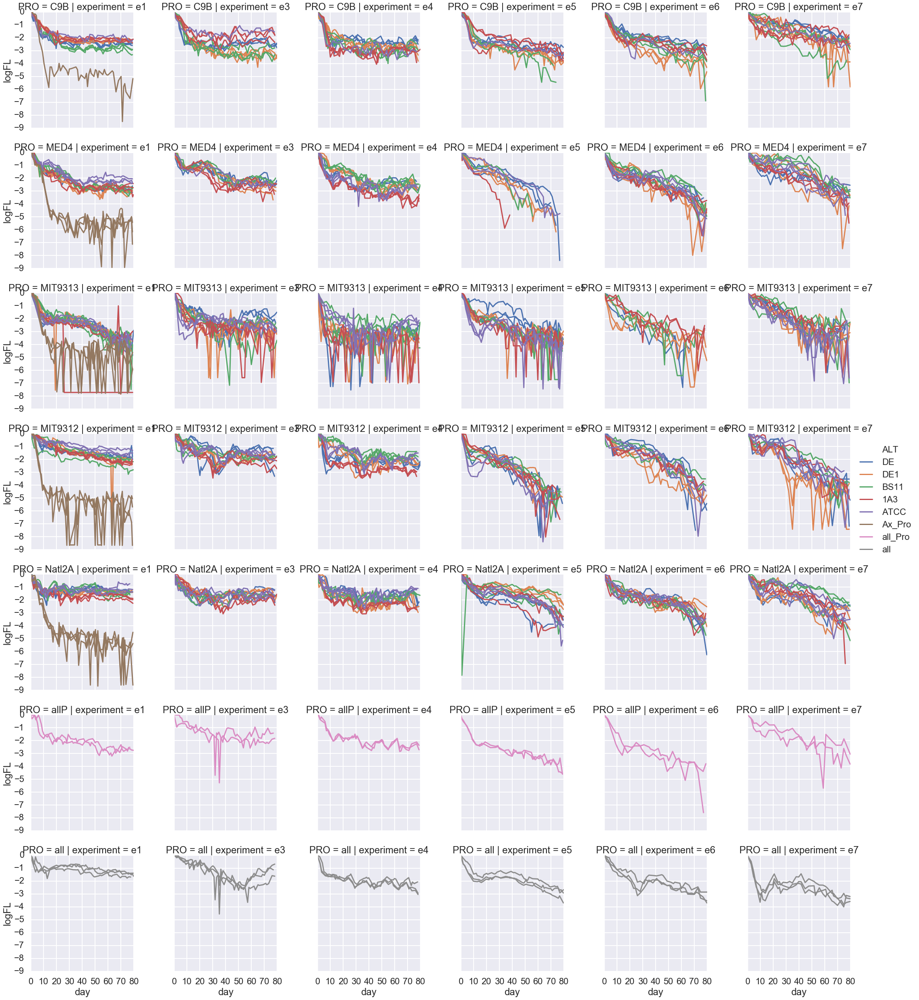

In [413]:
sns.relplot(data=dfd.loc[(dfd.experiment != 'e2') & (dfd.day < 80)], 
            x='day', y='logFL', col='experiment', kind='line', row='PRO',
             units='experiment_sample', estimator=None, hue='ALT'#col_wrap=3
           )

In [411]:
(max_day > 100).sum()

293

In [423]:
X = cp.experiments2X(dfd.loc[dfd.experiment != 'e2'])
metadf = cp.get_meta(df)
dfpca = cp.run_pca(X=X, metadf=metadf)


Variance percent explained
 [0.82559039 0.10836889]


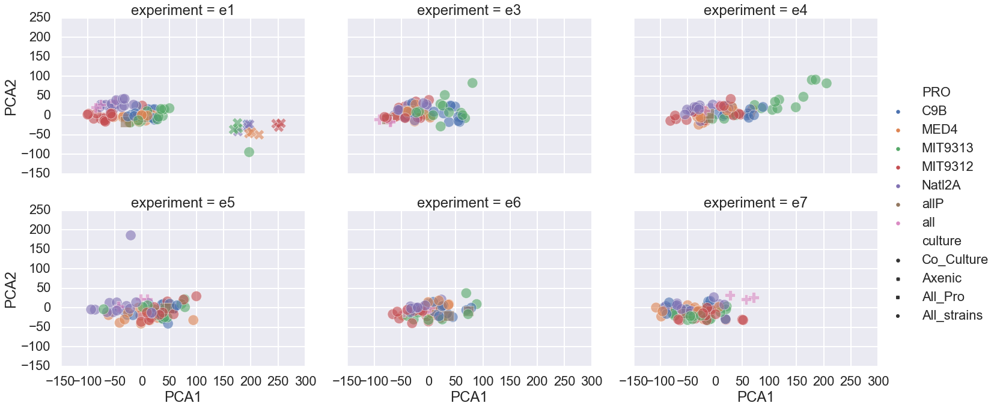

In [430]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, height=5, alpha=0.6,
            col='experiment', aspect=1.4, col_wrap=3)

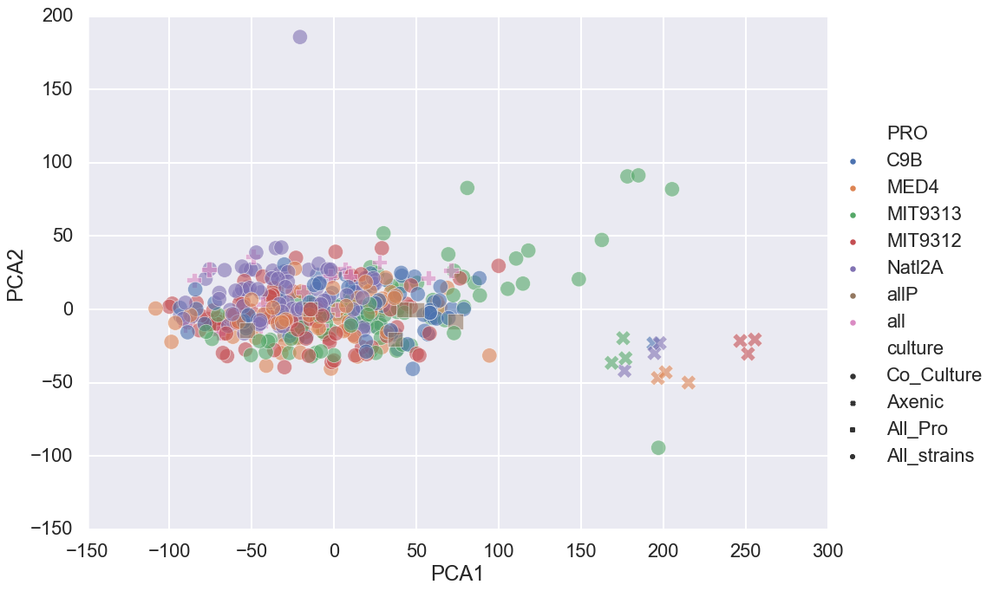

In [431]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, height=10, aspect=1.4, alpha=0.6,
           # col='experiment', col_wrap=3
           )

In [432]:
X = cp.experiments2X(dfd.loc[dfd.experiment != 'e2'], cumsummode=False)
metadf = cp.get_meta(df)
dfpca = cp.run_pca(X=X, metadf=metadf)


Variance percent explained
 [0.53639284 0.14964658]


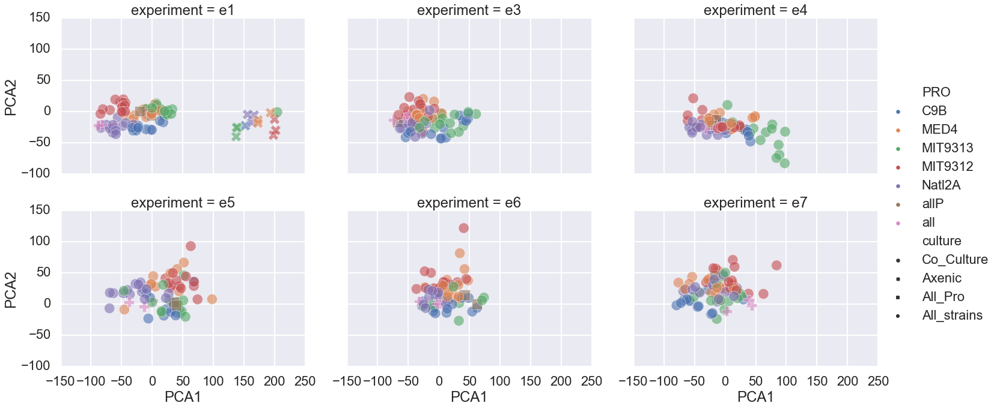

In [433]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, height=5, alpha=0.6,
            col='experiment', aspect=1.4, col_wrap=3)

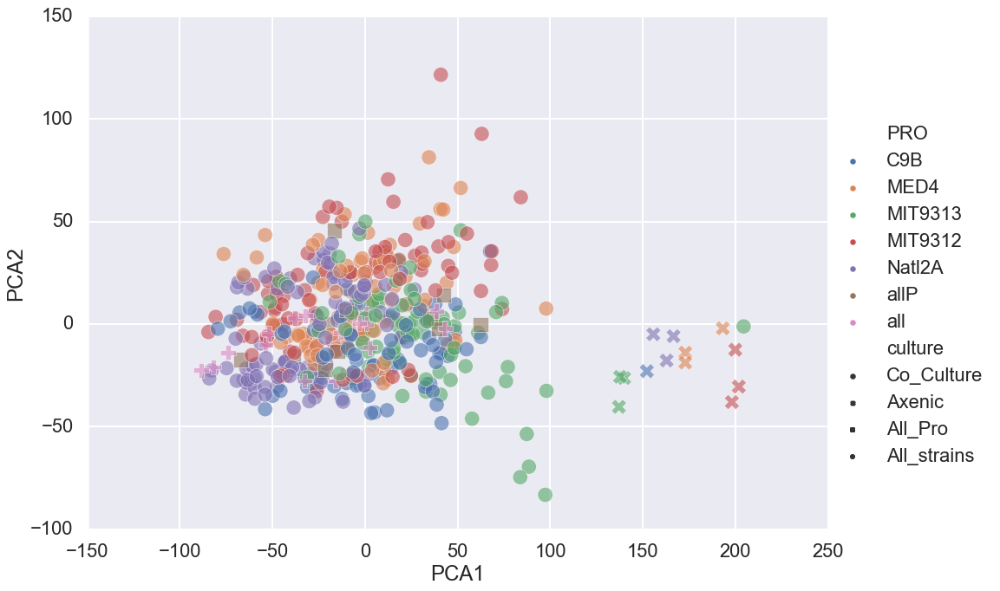

In [434]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, height=10, aspect=1.4, alpha=0.6,
           # col='experiment', col_wrap=3
           )

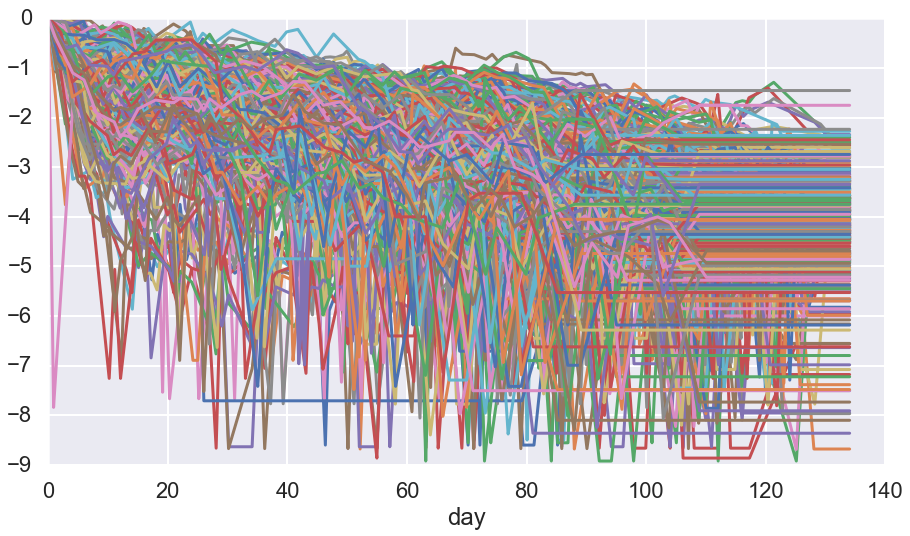

In [436]:
X.T.plot(legend=False)

In [439]:
X = cp.experiments2X(dfd.loc[dfd.experiment != 'e2'])
metadf = cp.get_meta(dfd.loc[dfd.experiment != 'e2'])
y = metadf['PRO']
clf = cp.forest_classifier(X=X, y=y)

0.4682713347921225


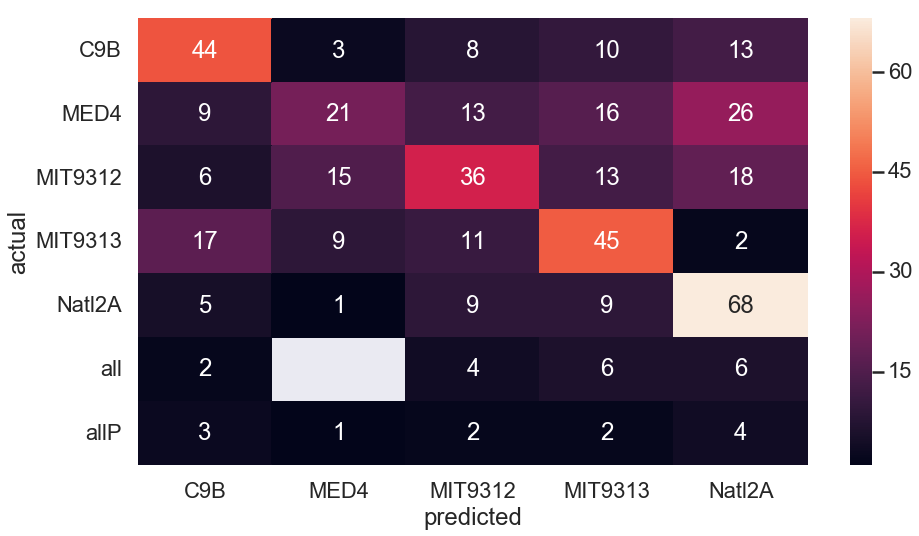

In [440]:
cp.forest_heatmap(clf=clf, X=X, y=y)

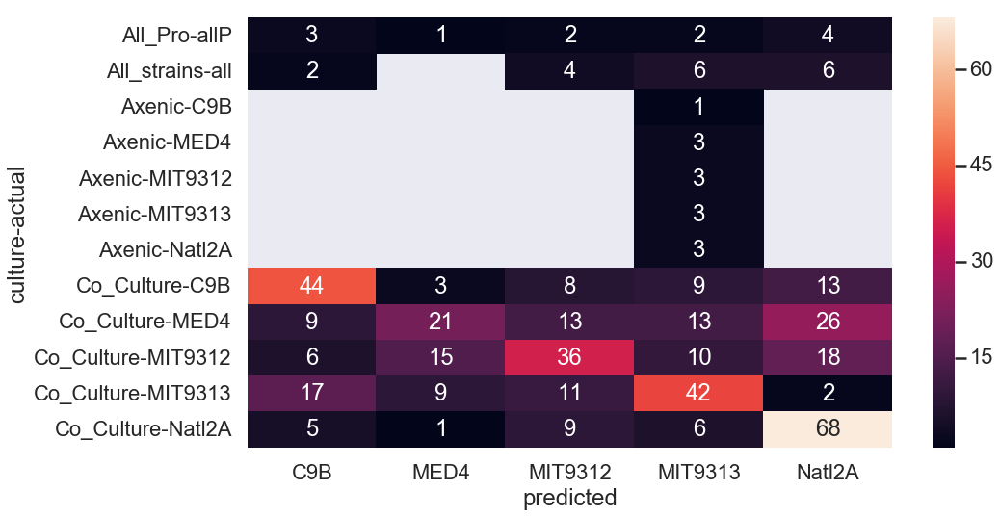

In [441]:
cp.forest_heatmap(clf, X, y, metadf=metadf, breakdown='culture')

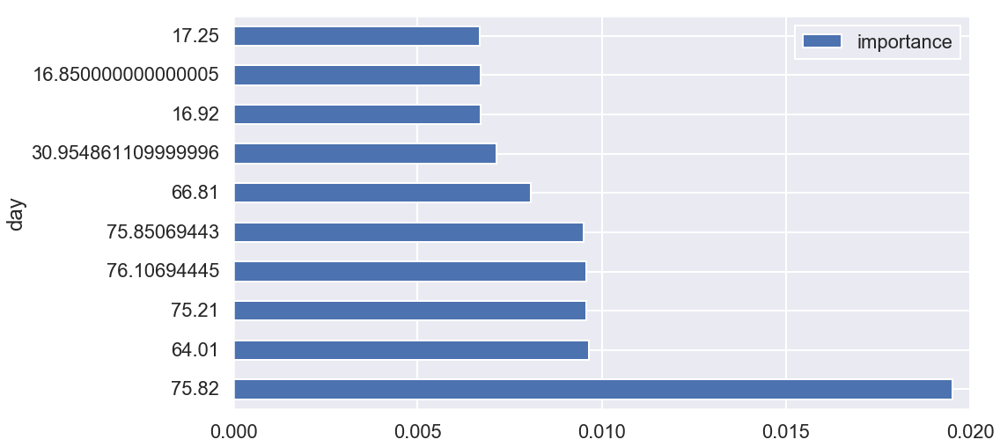

In [442]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

In [443]:
X = cp.experiments2X(dfd.loc[dfd.experiment != 'e2'], cumsummode=False)
metadf = cp.get_meta(dfd.loc[dfd.experiment != 'e2'])
y = metadf['PRO']
clf = cp.forest_classifier(X=X, y=y)

0.5382932166301969


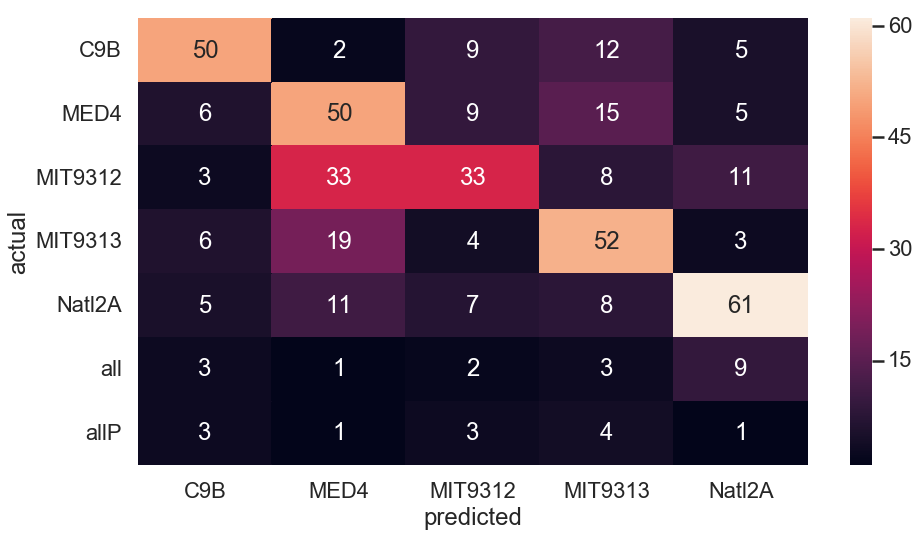

In [444]:
cp.forest_heatmap(clf=clf, X=X, y=y)

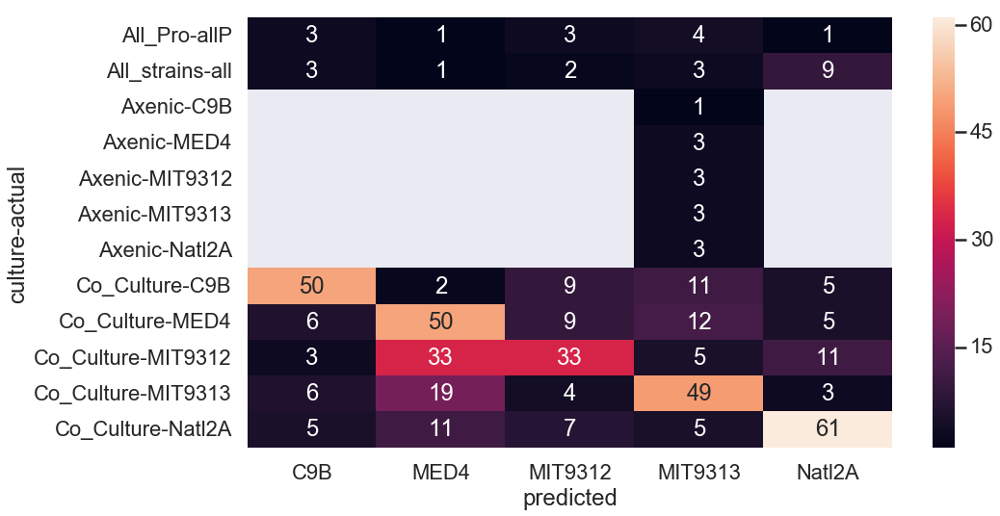

In [445]:
cp.forest_heatmap(clf, X, y, metadf=metadf, breakdown='culture')

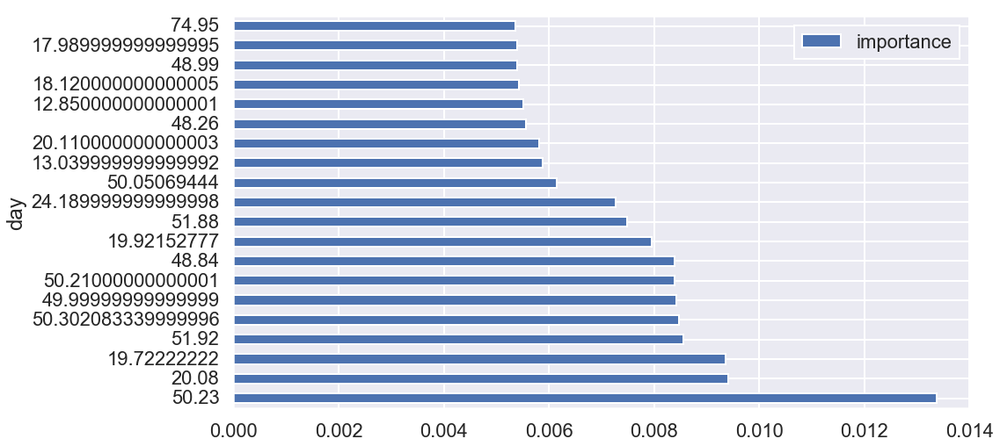

In [448]:
cp.forest_feature_importance(clf=clf, col_names=X.columns, n=20)

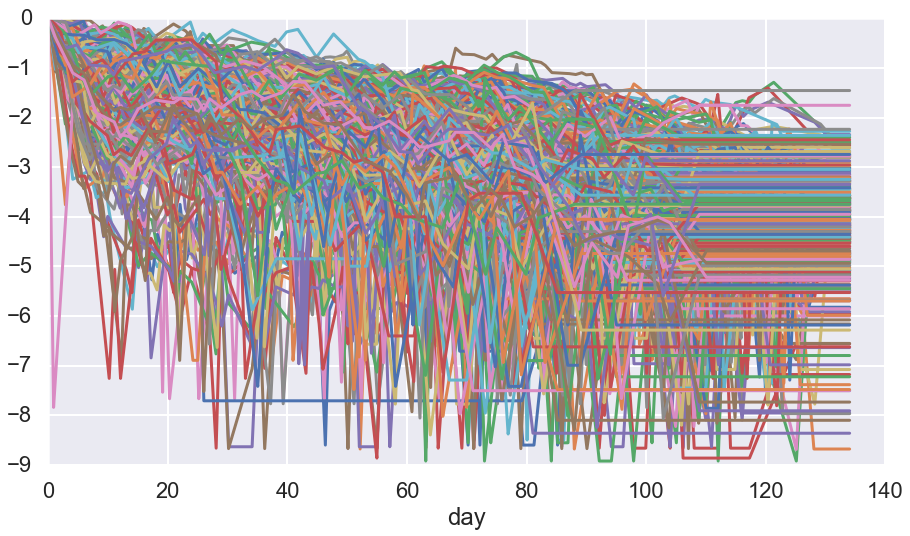

In [449]:
X.T.plot(legend=False)

In [451]:
gdecay = cp.generate_features(df=dfd.loc[dfd.experiment!= 'e2'])